In [10]:
import random
import draft.process_data_set as process_data_set
import importlib
import os
import cv2
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import time
import os
import cv2
import pandas as pd
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm
import time
from skimage.measure import shannon_entropy

# from ml_tools_utils import utils
import draft.ds_utils as ds_utils
import cv2
import numpy as np
from brisque import BRISQUE
import concurrent.futures as proc_futs
from scipy import stats

In [2]:
# https://www.kaggle.com/datasets/jangedoo/utkface-new

In [3]:
sns.set_theme(style="darkgrid", palette="pastel")
plt.style.use("fivethirtyeight")

## Dataset processing and analysis

#### Importing and verifying  the dataset:

In [4]:
SELECTED_DATASET = process_data_set.UNPROC_DATASET_LOC


`ImageHash` is a perceptual hashing library that allows us to detect if there are any very similar images in the dataset regardless of their physical size and minor color related differences.

In [6]:
dups = process_data_set.find_duplicates(SELECTED_DATASET)
dups

,Class,Duplicate Count,Total Images,Proportion
0,full,0,23086,0.0
1,Total,0,23086,0.0


In [ ]:
# Check for any invalid images that can't be opened
importlib.reload(process_data_set)
invalid_images = process_data_set.verify_and_clean_images(SELECTED_DATASET)
if len(invalid_images) > 0:
    raise Exception(invalid_images)

In [7]:
def calculate_luminance(image):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    return np.mean(gray)


def calculate_brisque(image):
    brisque_scorer = BRISQUE()
    return brisque_scorer.score(image)


def calculate_laplacian_variance(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if len(img.shape) == 3 else img
    return cv2.Laplacian(gray, cv2.CV_64F).var()


def calculate_fft_blur(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if len(img.shape) == 3 else img
    rows, cols = gray.shape
    crow, ccol = rows // 2, cols // 2

    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)
    fshift[crow - 30 : crow + 30, ccol - 30 : ccol + 30] = 0
    f_ishift = np.fft.ifftshift(fshift)
    img_back = np.fft.ifft2(f_ishift)
    img_back = np.abs(img_back)

    return np.mean(img_back)


def get_image_paths(data_dir):
    image_paths = []
    for subdir, _, files in os.walk(data_dir):
        for file in files:
            if file.endswith((".png", ".jpg", ".jpeg")):
                image_paths.append(os.path.join(subdir, file))
    return image_paths


def process_image(image_path, bins=32):
    image = cv2.imread(image_path)
    if image is None:
        return None

    color_type = "Unknown"
    if len(image.shape) == 2:
        color_type = "Grayscale"
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    elif len(image.shape) == 3:
        if image.shape[2] == 3:
            color_type = "Color"
        else:
            color_type = f"Other ({image.shape[2]} channels)"

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    original_shape = image.shape
    aspect_ratio = original_shape[1] / original_shape[0]
    image = cv2.resize(image, (100, 100))  # downsample image to reduce  size

    class_name = os.path.basename(os.path.dirname(image_path))
    color_distributions = {class_name: {"R": [], "G": [], "B": []}}
    for channel, color in enumerate(["R", "G", "B"]):
        hist = cv2.calcHist([image], [channel], None, [bins], [0, 256])
        hist = hist.flatten() / hist.sum()
        color_distributions[class_name][color] = hist

    variance = np.var(image, axis=(0, 1)).mean()
    unique_colors = len(np.unique(image.reshape(-1, image.shape[2]), axis=0))
    entropy = shannon_entropy(image)

    # new metrics
    brisque_score = calculate_brisque(image)
    laplacian_var = calculate_laplacian_variance(image)
    fft_blur_score = calculate_fft_blur(image)
    luminance = calculate_luminance(image)
    skin_tone = estimate_skin_tone(image)

    return (
        color_distributions,
        color_type,
        original_shape,
        aspect_ratio,
        variance,
        unique_colors,
        entropy,
        image_path,
        brisque_score,
        laplacian_var,
        fft_blur_score,
        luminance,
        skin_tone,
    )


def merge_color_distributions(distributions_list):
    class_counts = {}
    merged_distributions = {}

    for result in distributions_list:
        if result is None:
            continue
        distributions, _, _, _, _, _, _, _, _, _, _, _, _ = result
        for class_name, color_dist in distributions.items():
            if class_name not in merged_distributions:
                merged_distributions[class_name] = {
                    "R": np.zeros_like(color_dist["R"]),
                    "G": np.zeros_like(color_dist["G"]),
                    "B": np.zeros_like(color_dist["B"]),
                }
                class_counts[class_name] = 0
            for color in ["R", "G", "B"]:
                merged_distributions[class_name][color] += color_dist[color]
            class_counts[class_name] += 1

    for class_name in merged_distributions:
        for color in ["R", "G", "B"]:
            merged_distributions[class_name][color] /= class_counts[class_name]

    return merged_distributions


def is_grayscale(image):
    if len(image.shape) < 3:
        return True
    if image.shape[2] == 1:
        return True
    return np.allclose(image[:, :, 0], image[:, :, 1]) and np.allclose(
        image[:, :, 1], image[:, :, 2]
    )


def estimate_skin_tone(img):
    if img is None or is_grayscale(img):
        return np.nan

    ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)

    y, cr, cb = cv2.split(ycrcb)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    y_eq = clahe.apply(y)

    ycrcb_eq = cv2.merge([y_eq, cr, cb])

    height, width = ycrcb_eq.shape[:2]
    face_region = ycrcb_eq[height // 4 : 3 * height // 4, width // 4 : 3 * width // 4]

    avg_cr = np.mean(face_region[:, :, 1])
    avg_cb = np.mean(face_region[:, :, 2])

    skin_tone_score = (avg_cr - avg_cb + 256) / 2

    normalized_score = (skin_tone_score - 100) / (150 - 100) * 100

    return np.clip(normalized_score, 0, 100)


def get_color_distributions(image_paths, max_workers=None):
    start_time = time.time()

    if max_workers is None:
        max_workers = os.cpu_count()

    print(f"Running on {max_workers} workers")

    color_distributions_list = []
    color_types = []
    shapes = []
    aspect_ratios = []
    variances = []
    unique_colors = []
    entropies = []
    image_paths_list = []

    brisque_scores = []
    laplacian_vars = []
    fft_blur_scores = []
    luminances = []
    skin_tones = []

    print(f"Total images: {len(image_paths)}")
    with proc_futs.ProcessPoolExecutor(max_workers=max_workers) as executor:

        futures = {
            executor.submit(process_image, image_path): image_path
            for image_path in image_paths
        }
        for future in tqdm(
            proc_futs.as_completed(futures),
            total=len(futures),
            desc="Processing images",
        ):
            result = future.result()
            if result is not None:
                color_distributions_list.append(result)
                color_types.append(result[1])
                shapes.append(result[2])
                aspect_ratios.append(result[3])
                variances.append(result[4])
                unique_colors.append(result[5])
                entropies.append(result[6])
                image_paths_list.append(result[7])

                brisque_scores.append(result[8])
                laplacian_vars.append(result[9])
                fft_blur_scores.append(result[10])
                luminances.append(result[11])
                skin_tones.append(result[12])

    color_distributions = merge_color_distributions(color_distributions_list)
    elapsed_time = time.time() - start_time
    print(f"Total processing time: {elapsed_time:.2f} seconds")

    return (
        color_distributions,
        color_types,
        shapes,
        aspect_ratios,
        variances,
        unique_colors,
        entropies,
        image_paths_list,
        brisque_scores,
        laplacian_vars,
        fft_blur_scores,
        luminances,
        skin_tones,
    )


def summarize_image_types(image_paths, color_types):
    summary = pd.DataFrame({"image_path": image_paths, "color_type": color_types})
    summary_table = summary["color_type"].value_counts().reset_index()
    summary_table.columns = ["Color Type", "Count"]
    return summary_table


def summarize_dimensions(image_paths, shapes):
    summary = pd.DataFrame({"image_path": image_paths, "shape": shapes})
    width_summary = summary["shape"].apply(lambda x: x[1]).value_counts().reset_index()
    width_summary.columns = ["Width", "Count"]
    height_summary = summary["shape"].apply(lambda x: x[0]).value_counts().reset_index()
    height_summary.columns = ["Height", "Count"]
    aspect_ratio_summary = (
        summary["shape"].apply(lambda x: x[1] / x[0]).value_counts().reset_index()
    )
    aspect_ratio_summary.columns = ["Aspect Ratio", "Count"]
    return width_summary, height_summary, aspect_ratio_summary


def bin_images_by_luminance(luminances, num_bins=5):
    bin_edges = np.linspace(0, 255, num_bins + 1)
    bin_indices = np.digitize(luminances, bin_edges) - 1

    return bin_indices


def summarize_color_metrics(
    image_paths,
    variances,
    unique_colors,
    entropies,
    brisque_scores,
    laplacian_vars,
    fft_blur_scores,
    luminances,
    skint_tones,
):
    bin_indices = bin_images_by_luminance(luminances, num_bins=5)

    summary = pd.DataFrame(
        {
            "image_path": image_paths,
            "variance": variances,
            "unique_colors": unique_colors,
            "entropy": entropies,
            "brisque_score": brisque_scores,
            "laplacian_variance": laplacian_vars,
            "fft_blur_score": fft_blur_scores,
            "luminance": luminances,
            "luminance_bin": bin_indices,
            "skin_tone": skint_tones,
        }
    )
    return summary


def plot_color_distributions(color_distributions, bins=32):
    global_min, global_max = 0, 0
    for class_name, distributions in color_distributions.items():
        for color in ["R", "G", "B"]:
            max_value = max(distributions[color])
            if max_value > global_max:
                global_max = max_value

    for class_name, distributions in color_distributions.items():
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        for i, (color, ax) in enumerate(zip(["R", "G", "B"], axes)):
            ax.bar(range(bins), distributions[color], color=color.lower(), alpha=0.7)
            ax.set_title(f"{class_name} - {color} Channel Distribution")
            ax.set_xlabel("Intensity")
            ax.set_ylabel("Density")
            ax.set_ylim(0, global_max)
        plt.tight_layout()
        plt.show()


def plot_filtered_images_by_entropy(
    filtered_image_paths, filtered_entropies, images_per_row=4, metric_label="Entropy"
):
    num_images = len(filtered_image_paths)
    num_rows = (num_images + images_per_row - 1) // images_per_row
    fig, axes = plt.subplots(num_rows, images_per_row, figsize=(20, 5 * num_rows))
    axes = axes.flatten()

    for ax, (image_path, entropy) in zip(
        axes, zip(filtered_image_paths, filtered_entropies)
    ):
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        class_name = os.path.basename(os.path.dirname(image_path))
        file_name = os.path.basename(image_path)[:20]
        ax.imshow(image)
        ax.set_title(f"{class_name}/{file_name}\n{metric_label}: {entropy:.2f}")
        ax.axis("off")

    for ax in axes[num_images:]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

In [8]:
importlib.reload(process_data_set)
image_paths = get_image_paths(SELECTED_DATASET)

In [11]:
(
    color_distributions,
    color_types,
    shapes,
    aspect_ratios,
    variances,
    unique_colors,
    entropies,
    image_paths,
    brisque_scores,
    laplacian_vars,
    fft_blur_scores,
    luminances,
    skin_tones,
) = get_color_distributions(image_paths, max_workers=16)

Running on 16 workers
Total images: 23086


Processing images: 100%|██████████| 23086/23086 [05:18<00:00, 72.47it/s]


Total processing time: 320.58 seconds


### Image color summary
There seem to be no grayscale images and all images have 3 color channels.

In [14]:
summary_table = summarize_color_metrics(
    image_paths,
    variances,
    unique_colors,
    entropies,
    brisque_scores,
    laplacian_vars,
    fft_blur_scores,
    luminances=luminances,
    skint_tones=skin_tones,
)

In [15]:
image_entropy_summary = summarize_color_metrics(
    image_paths,
    variances,
    unique_colors,
    entropies,
    brisque_scores=brisque_scores,
    laplacian_vars=laplacian_vars,
    fft_blur_scores=fft_blur_scores,
    luminances=luminances,
    skint_tones=skin_tones,
)

variance_summary = image_entropy_summary["variance"].describe()
unique_colors_summary = image_entropy_summary["unique_colors"].describe()
entropy_summary = image_entropy_summary["entropy"].describe()

summary_df = pd.DataFrame(
    {
        "Variance": variance_summary,
        "Unique Color": unique_colors_summary,
        "Entropy": entropy_summary,
    }
)

In [107]:
def plot_entropy_distribution(data,
                              x_col="entropy",
                              row_col=None, suptitle=None, xlim=(6.5, None), binwidth=0.1, xlim=(0, None)
                              height=3, aspect=2.5):
    """
    Plot entropy distribution with annotations for median, mean, and standard deviation.

    :param data: DataFrame containing the data
    :param x_col: Column name for x-axis (default: "entropy")
    :param row_col: Column name for row faceting (default: "gender")
    :param suptitle: Super title for the plot
    :param xlim: x-axis limits as tuple (min, max)
    :param binwidth: Width of histogram bins
    :param height: Height of each facet in inches
    :param aspect: Aspect ratio of each facet
    :return: seaborn FacetGrid object
    """
    g = sns.displot(
        data, x=x_col,
        row=row_col, binwidth=binwidth, height=height, aspect=aspect,
        facet_kws=dict(margin_titles=True)
    ).set(xlim=xlim)

    g.fig.suptitle(suptitle, y=1.02)

    for (row_val, row_data), ax in zip(data.groupby(row_col), g.axes.flat):
        entropy_data = row_data[x_col]

        median = entropy_data.median()
        mean = entropy_data.mean()
        std = entropy_data.std()

        text_color = ax.yaxis.get_ticklabels()[0].get_color()

        ax.axvline(median, color=text_color, linestyle='--', alpha=0.9, linewidth=1.5)
        ax.axvline(mean, color=text_color, linestyle='--', alpha=0.9, linewidth=1.5)

        ylim = ax.get_ylim()
        yrange = ylim[1] - ylim[0]

        ax.text(median, ylim[1], f'Median: {median:.2f}', color=text_color, ha='left', va='top', rotation=0,
                fontsize=10)
        ax.text(mean, ylim[1] - 0.45 * yrange, f'Mean: {mean:.2f}', color=text_color, ha='left', va='top', rotation=0,
                fontsize=10)
        ax.text(ax.get_xlim()[1], ylim[1], f'Std: {std:.2f}', color=text_color, ha='left', va='top', fontsize=10)

        ax.set_xlim(xlim)

    plt.tight_layout()
    return g




SyntaxError: invalid syntax. Perhaps you forgot a comma? (2020501322.py, line 3)

In [16]:
importlib.reload(ds_utils)

image_entropy_summary = ds_utils.process_image_metadata(
    image_entropy_summary, "image_path"
)
image_entropy_summary["Images"] = "0"

image_entropy_summary.to_csv("../dataset/image_entropy_summary.csv", index=False)

In [17]:
image_entropy_summary

,image_path,variance,unique_colors,entropy,brisque_score,laplacian_variance,fft_blur_score,luminance,luminance_bin,skin_tone,age,gender,age_group,age_bin_raw,Images
0,../dataset/full/10_0_0_20170110220033115.jpg.c...,1477.253495,6267,6.857390,33.980056,256.865812,2.312982,203.8070,3,12.5248,10,0,0-18,0-10,0
1,../dataset/full/10_0_0_20170110224406532.jpg.c...,2452.172032,8298,7.718125,33.397515,244.865678,2.826604,141.7135,2,23.6788,10,0,0-18,0-10,0
2,../dataset/full/10_0_0_20170110220255346.jpg.c...,2980.936287,8942,7.736862,44.824772,123.788397,2.063477,158.8874,3,25.4196,10,0,0-18,0-10,0
3,../dataset/full/10_0_0_20170110220251986.jpg.c...,3365.068846,6339,7.209920,24.517992,657.658092,3.654595,130.6373,2,20.3080,10,0,0-18,0-10,0
4,../dataset/full/10_0_0_20170110220403810.jpg.c...,4118.893420,8065,7.896404,52.822707,74.278110,2.606479,122.2249,2,21.0340,10,0,0-18,0-10,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23081,../dataset/full/9_1_2_20170104020210475.jpg.ch...,1676.861665,5791,7.260590,37.093527,176.641079,2.029646,138.5114,2,23.7608,9,1,0-18,0-10,0
23082,../dataset/full/9_1_2_20161219204347420.jpg.ch...,1255.620365,7693,7.232986,42.996096,49.222689,1.349526,83.3686,1,23.2144,9,1,0-18,0-10,0
23083,../dataset/full/9_1_4_20170103200814791.jpg.ch...,3325.250201,8696,7.875873,11.624793,914.503642,3.635523,145.6209,2,7.2624,9,1,0-18,0-10,0
23084,../dataset/full/9_1_3_20161219225144784.jpg.ch...,1996.379638,6084,7.345491,55.754715,46.323105,1.265786,86.5876,1,42.3900,9,1,0-18,0-10,0


In [39]:
def get_distribution_stats(df, target_col="age"):
    def _get_distribution_stats(data):
        return pd.Series(
            {
                "Count": data.count(),
                "Prop.": data.count() / len(df),
                "Mean": data.mean(),
                "Median": data.median(),
                "Mode": data.mode().iloc[0],
                "Std Dev": data.std(),
                "IQR": data.quantile(0.75) - data.quantile(0.25),
                "5th Percentile": data.quantile(0.05),
                "25th Percentile": data.quantile(0.25),
                "75th Percentile": data.quantile(0.75),
                "95th Percentile": data.quantile(0.95),
                "Minimum": data.min(),
                "Maximum": data.max(),
                "Skewness": data.skew(),
                "Kurtosis": data.kurtosis(),
            }
        )

    male_stats = _get_distribution_stats(df[df["gender"] == 0][target_col])
    female_stats = _get_distribution_stats(df[df["gender"] == 1][target_col])
    all_stats = _get_distribution_stats(df[target_col])

    age_distribution = pd.DataFrame(
        {"Male": male_stats, "Female": female_stats, "All": all_stats}
    )

    age_distribution = age_distribution.round(2)
    return age_distribution

## Age and Gender Distribution



/tmp/ipykernel_2896/1480114290.py:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=image_entropy_summary, x='age', shade=True)


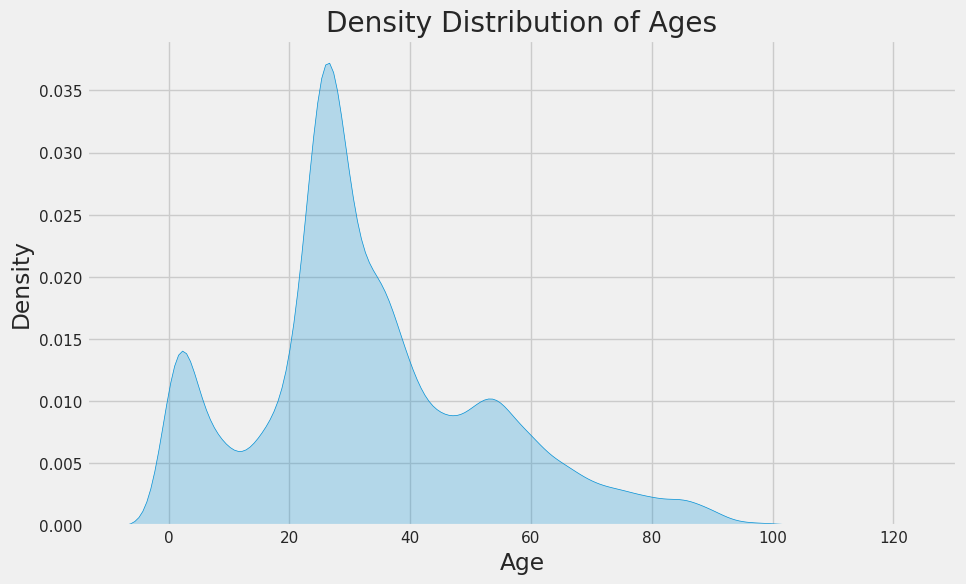

In [33]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=image_entropy_summary, x="age", shade=True)
plt.title("Density Distribution of Ages")
plt.xlabel("Age")
plt.ylabel("Density")
plt.show()

The distribution of ages in the dataset doesn't seem to be inline with general demographic trends in most countries:
- Newborns and young children and young working age people between 20-40 are disproportionally overrepresented.
- There are relatively few samples of teenagers and those above 50-60

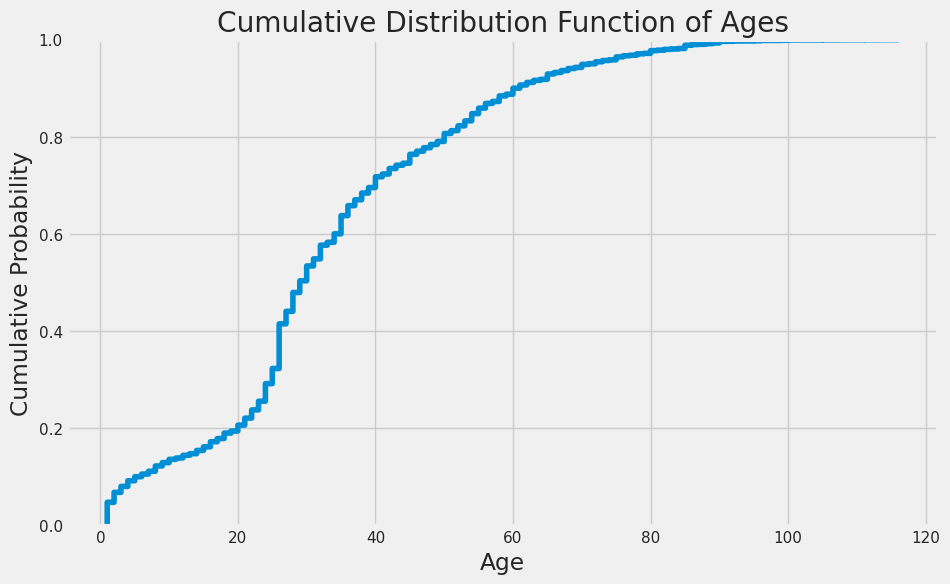

In [35]:
plt.figure(figsize=(10, 6))
sns.ecdfplot(data=image_entropy_summary, x="age")
plt.title("Cumulative Distribution Function of Ages")
plt.xlabel("Age")
plt.ylabel("Cumulative Probability")
plt.show()

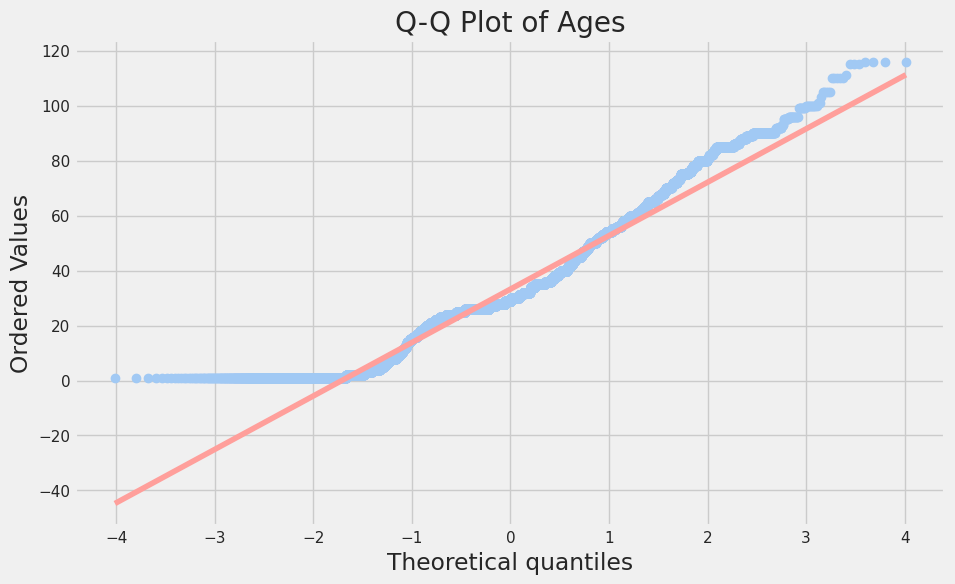

In [36]:
plt.figure(figsize=(10, 6))
stats.probplot(image_entropy_summary["age"], dist="norm", plot=plt)
plt.title("Q-Q Plot of Ages")
plt.show()

The uneven distribution will likely impact the model's performance and generalization capabilities across different age groups so that's something we'll need to pay attention to and find ways to handle it if that's the case.

#### Gender Balance and Distribution

While the balance between and male and female samples is relatively acceptable (53:47) we can see that their distribution across different age groups is quite different:

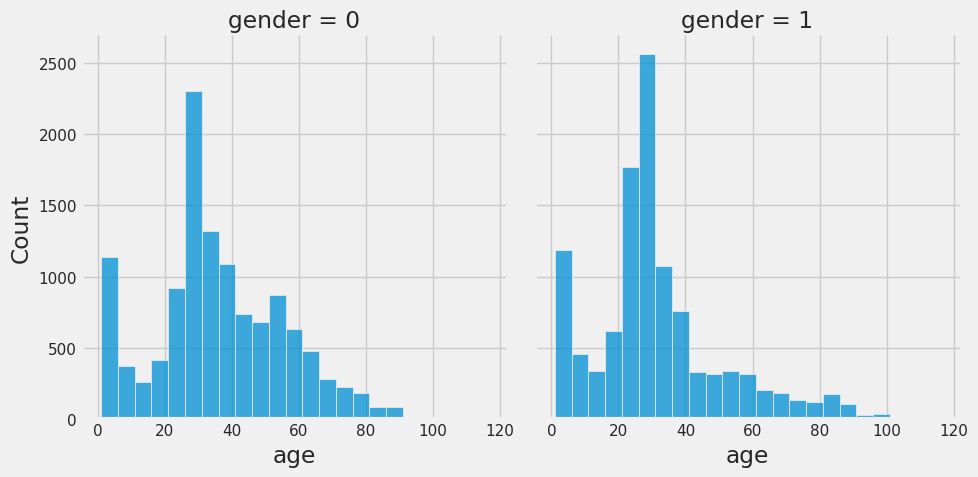

In [20]:
sns.displot(
    image_entropy_summary,
    x="age",
    col="gender",
    binwidth=5,
    height=5,
    facet_kws=dict(margin_titles=True),
)

`(1 = Female)`

In [22]:
get_distribution_stats(image_entropy_summary)

,Male,Female,All
Count,12069.00,11017.00,23086.00
Prop.,0.52,0.48,1.00
Mean,35.65,30.62,33.25
Median,34.00,26.00,29.00
Mode,26.00,26.00,26.00
Std Dev,19.72,19.69,19.86
IQR,25.00,16.00,22.00
5th Percentile,1.00,2.00,2.00
25th Percentile,25.00,21.00,23.00
75th Percentile,50.00,37.00,45.00


On average males in the photographs seem to be significantly older, at least in the middle of the range (25-50th percentiles). Above a certain age (~70) the proportion of females increase significantly. This again, raises certain issues and is something we'll need to pay close attention to when evaluating our model.

In [32]:
result = (
    image_entropy_summary.groupby(["age_bin_raw", "gender"], observed=False)
    .size()
    .unstack(fill_value=0)
)
result.columns = ["Male", "Female"]

result["Total"] = result.sum(axis=1)
result = result.sort_index()

result

,Male,Female,Total
age_bin_raw,,,
0-10,1509,1638,3147
10-20,672,952,1624
20-30,3223,4339,7562
30-40,2408,1828,4236
40-50,1417,640,2057
50-60,1500,650,2150
60-70,754,378,1132
70-80,406,247,653
80-90,168,274,442


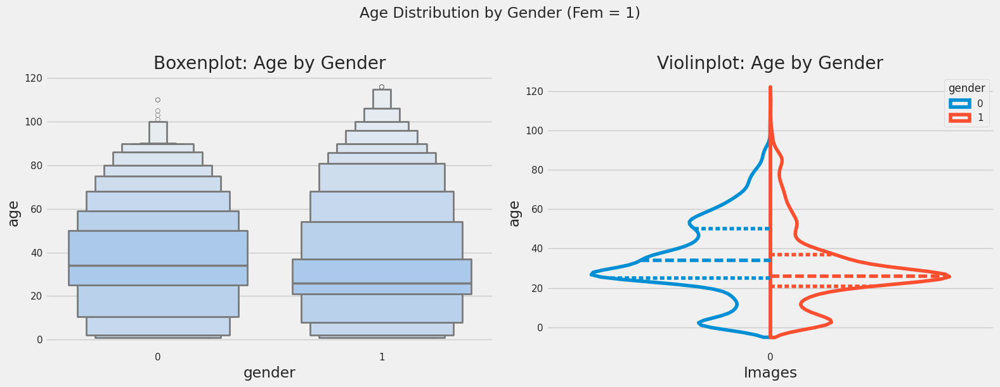

In [37]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

sns.boxenplot(
    data=image_entropy_summary,
    x="gender",
    y="age",
    color="b",
    width_method="linear",
    ax=ax1,
)
ax1.set_title("Boxenplot: Age by Gender")

sns.violinplot(
    data=image_entropy_summary,
    x="Images",
    y="age",
    hue="gender",
    split=True,
    inner="quart",
    fill=False,
    ax=ax2,
)
ax2.set_title("Violinplot: Age by Gender")

plt.suptitle("Age Distribution by Gender (Fem = 1)", y=1.02)

plt.tight_layout()
plt.show()

Text(0.5, 1.02, 'Distribution of Age Groups by Gender (Fem = 1)')

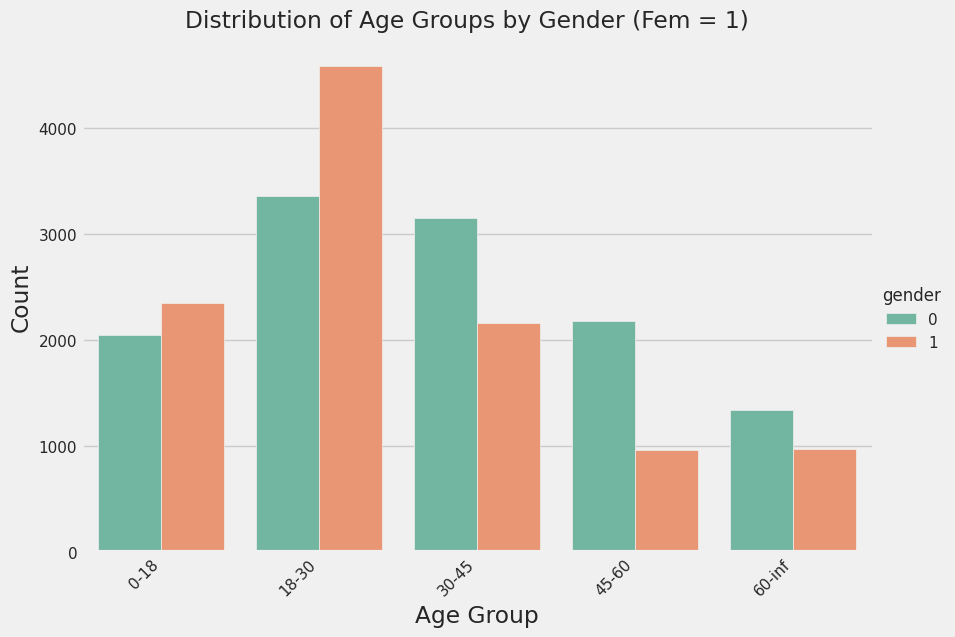

In [102]:
g = sns.catplot(
    data=image_entropy_summary,
    x="age_group",
    hue="gender",
    kind="count",
    height=6,
    aspect=1.5,
    palette="Set2",
)

g.set_xticklabels(rotation=45, ha="right")
g.set(xlabel="Age Group", ylabel="Count")
g.fig.suptitle("Distribution of Age Groups by Gender (Fem = 1)", y=1.02)

### Image Analysis

We'll perform an in-depth analysis of some key characteristics, like:
- Luminance distribution
- Color variance and distribution
- Image entropy
- Image quality (using `BRISQUE`, `FFT`,  Laplacian variance)

We want to make sure that we have a comprehensive understanding of our dataset since that will impact our preprocessing (selection of transformation and augmentation techniques)  and other decisions.

Additionally, we'll use a combination of these metrics to improve the robustness of your evaluation pipeline:

- Luminance and color information is used to assess the model's performance over different skin tone ranges.
- Image quality analysis will allow use to  eliminate or at least identify invalid (i.e. extremely blurry or cropped images) and measure their impact on overall performance.


### Color Variance and Entropy

- Average variance of color channels in the all images:
    - Variance = 0: All pixels in the image have the same color.
    - High Variance: Indicates images with diverse color pixels.

- Number of unique colors in each image

- Entropy (shannon_entropy).
    - Scale: 0 to log2(N), where N is the number of possible pixel values (0 to 8 for 256 grayscale values).
        - Min Entropy = 0: Perfectly uniform image (single color).
        - High Entropy: Indicates images with a wide variety of colors and patterns.


In [ ]:
#### Entropy:

In [45]:
get_distribution_stats(image_entropy_summary, target_col="entropy")

,Male,Female,All
Count,12069.00,11017.00,23086.00
Prop.,0.52,0.48,1.00
Mean,7.52,7.59,7.55
Median,7.57,7.64,7.61
Mode,4.28,5.60,4.28
Std Dev,0.27,0.25,0.26
IQR,0.33,0.30,0.32
5th Percentile,7.02,7.11,7.06
25th Percentile,7.38,7.47,7.42
75th Percentile,7.71,7.77,7.74


In [ ]:
#### Color Variance:

In [44]:
get_distribution_stats(image_entropy_summary, target_col="variance")

,Male,Female,All
Count,12069.00,11017.00,23086.00
Prop.,0.52,0.48,1.00
Mean,2548.27,3013.95,2770.50
Median,2338.08,2781.21,2540.88
Mode,201.43,293.90,201.43
Std Dev,1195.63,1397.19,1316.42
IQR,1525.39,1851.76,1701.91
5th Percentile,1006.69,1139.91,1063.60
25th Percentile,1672.27,1973.63,1803.40
75th Percentile,3197.67,3825.39,3505.31


While male and female images have comparable overall color complexity or information content (entropy) higher variance in female images indicates that the colors in these images are more spread out from the mean color.

e.g. females image might contain a wide range of colors (high variance) in a balanced, evenly distributed manner (similar entropy to male images). For instance, a colorful floral dress with many different hues, but well-distributed throughout the image.


This would raise a few questions that could influence or preprocessing pipeline and the model itself:
- Difference in color variance between male and female images could become a strong predictive feature for gender classification. However, the model, might become overly reliant on color variance, potentially misclassifying males with high color variance or females with low color variance.
- While this affect won't be noticeable when testing on a sample of the same dataset (or is likely to improve the models performance) it might mean that the model might perform worse in real world conditions or different datasets because a part of its decision-making is based not core facial attributes but clothing, cosmetics and other external factors (assuming our hypothesis is correct).

We'll try to handle this by including various augmentation techniques that add color jitter to individual samples and even remove all color information from images (however we'd need to use a different dataset to fully verify this)

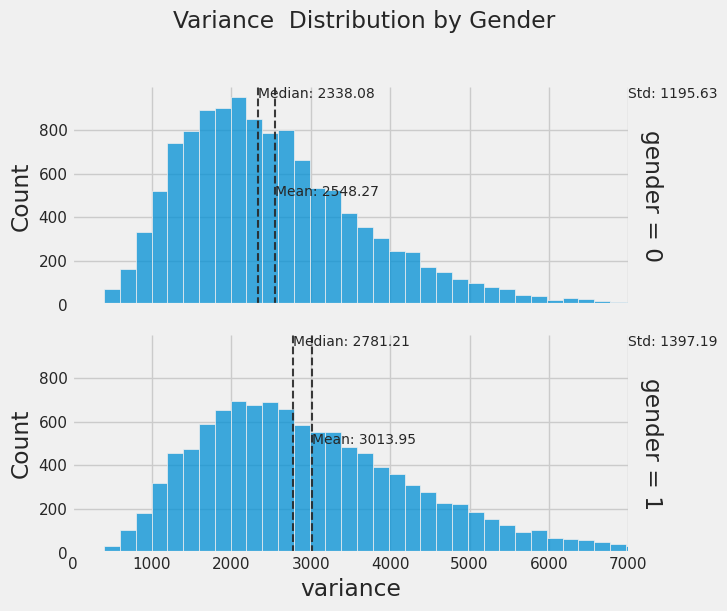

In [111]:
g = plot_entropy_distribution(
    image_entropy_summary,
    suptitle="Variance  Distribution by Gender",
    binwidth=200,
    xlim=(0, 7000),
    x_col="variance",
    row_col="gender",
)
plt.show()

/tmp/ipykernel_2896/290011491.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for (row_val, row_data), ax in zip(data.groupby(row_col), g.axes.flat):


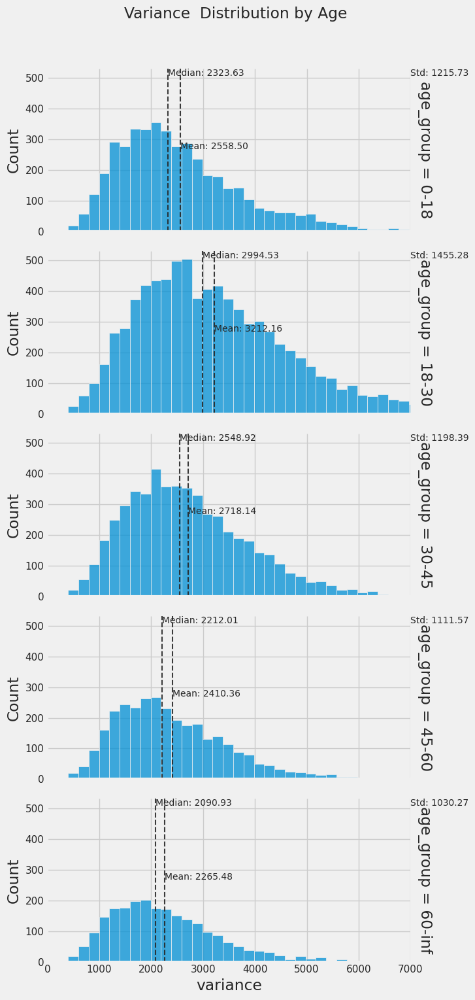

In [110]:
g = plot_entropy_distribution(
    image_entropy_summary,
    suptitle="Variance  Distribution by Age ",
    binwidth=200,
    xlim=(0, 7000),
    x_col="variance",
    row_col="age_group",
)
plt.show()

We can see similar differences when comparing different age groups as well.

In [135]:
def render_image_grid_by_variable(
    target: str, values: [], prct_thresh=0.5, max_samples=35, higher_is_better=False
):
    if higher_is_better:
        thresh = np.percentile(image_entropy_summary[target], 100 - prct_thresh, axis=0)
        filtered_image_paths = [
            path for path, v in zip(image_paths, values) if v > thresh
        ]
        filtered_values = [v for v in values if v > thresh]
    else:
        thresh = np.percentile(image_entropy_summary[target], prct_thresh, axis=0)
        filtered_image_paths = [
            path for path, v in zip(image_paths, values) if v < thresh
        ]
        filtered_values = [v for v in values if v < thresh]

    if len(filtered_image_paths) > max_samples:
        raise Exception(
            f"{'Raise' if higher_is_better else 'Lower'} {target} threshold, current samples N={len(filtered_image_paths)} > max_samples"
        )

    plot_filtered_images_by_entropy(
        filtered_image_paths,
        filtered_values,
        images_per_row=5,
        metric_label=target.capitalize().replace("_", " "),
    )


def render_image_grid_by_variable(
    df,
    column: str,
    prct_thresh=0.5,
    sample_n=16,
    max_samples=35,
    higher_is_better=False,
):
    df = df[df[column].notna()]

    if higher_is_better:
        thresh = np.percentile(df[column], 100 - prct_thresh)
        filtered_df = df[df[column] > thresh]
    else:
        thresh = np.percentile(df[column], prct_thresh)
        filtered_df = df[df[column] < thresh]

    print(f"thresh: {thresh}, filtered_df: {len(filtered_df)}")

    filtered_df = filtered_df.sample(sample_n)

    if len(filtered_df) > max_samples:
        raise Exception(
            f"{'Raise' if higher_is_better else 'Lower'} {column} threshold, current samples N={len(filtered_df)} > max_samples"
        )

    plot_filtered_images_by_entropy(
        filtered_df["image_path"].tolist(),
        filtered_df[column].tolist(),
        images_per_row=5,
        metric_label=column.capitalize().replace("_", " "),
    )


def render_arbitrary_image_set(df, value_column: str, images_per_row=5):
    plot_filtered_images_by_entropy(
        df["image_path"].tolist(),
        df[value_column].tolist(),
        images_per_row=images_per_row,
        metric_label=value_column.capitalize().replace("_", " "),
    )

### Skin Color Estimation

Additionally, we'll try to determine the skin color of the subjects so that we could later measure whether that has an impact on the performance of our model.

We've attempted to use various heuristics (or their combination) for this, however we've found that just using `luminance` directly provides the most predictable and reasonable useful results:


thresh: 60.112435, filtered_df: 231


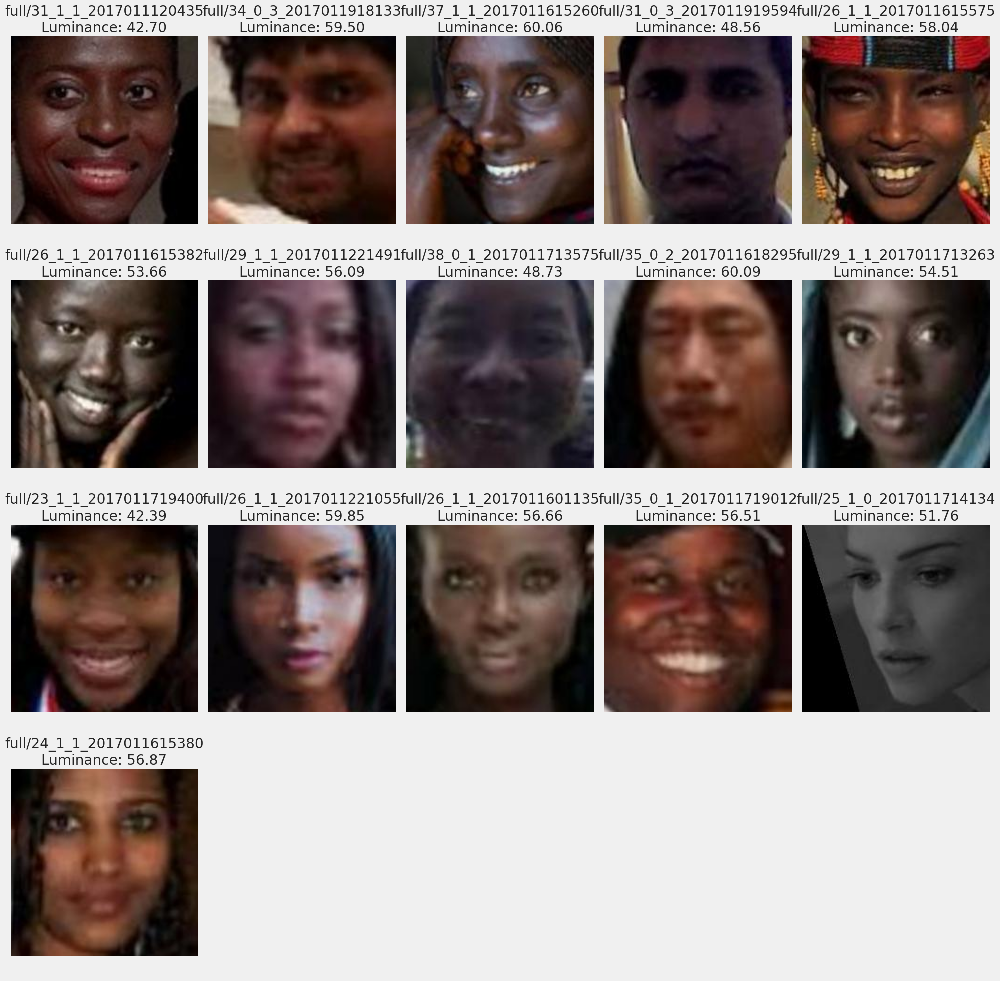

In [122]:
render_image_grid_by_variable(
    image_entropy_summary, "luminance", prct_thresh=1, higher_is_better=False
)

thresh: 194.07173500000016, filtered_df: 231


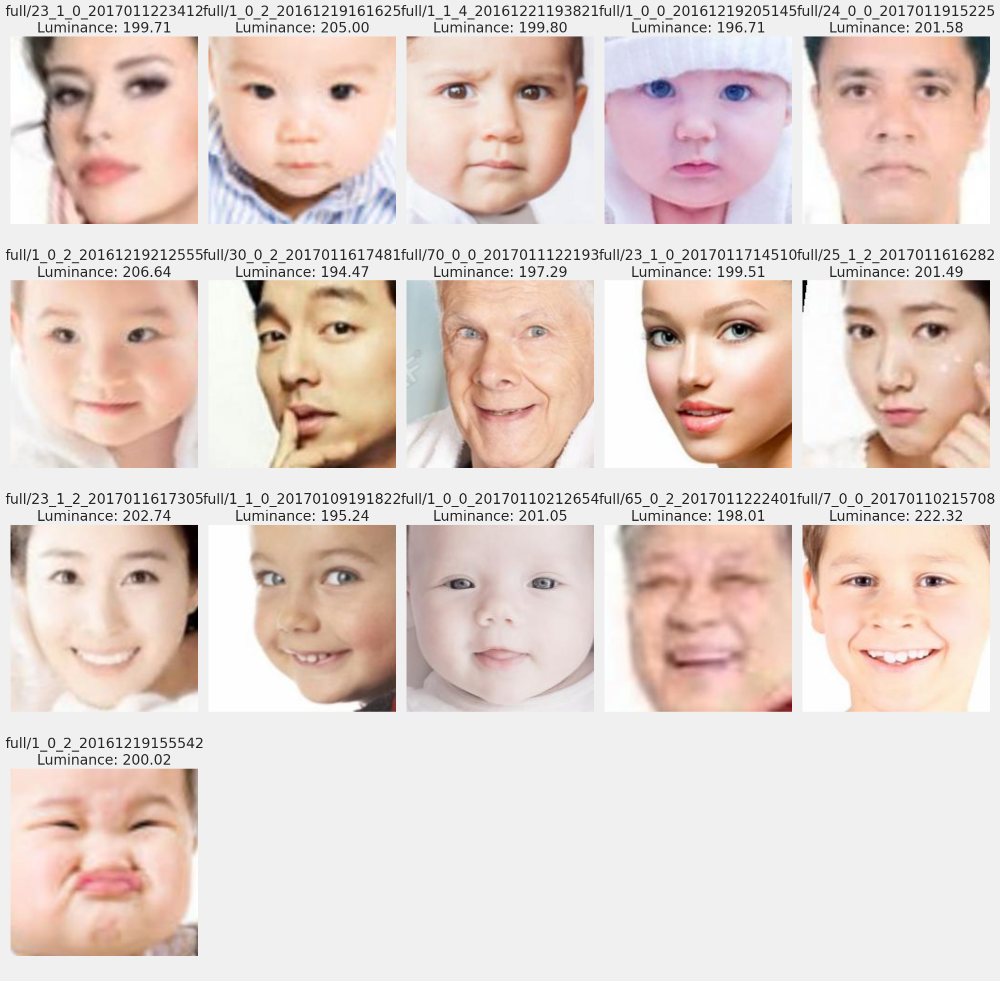

In [123]:
render_image_grid_by_variable(
    image_entropy_summary, "luminance", prct_thresh=1, higher_is_better=True
)

### Measuring Image Quality

The quality and validity of the data we're using also has a significant effect (even if it's not-necessarily easy to estimate when using the same dataset for evaluation).

While the UTK dataset is relatively high quality it still contains some invalid images (and some probably mislabeled ones, but we'll get to that later)


#### BRISQUE (Blind/Referenceless Image Spatial Quality Evaluator):

A no-reference image quality assessment method.
Uses scene statistics of locally normalized luminance coefficients to quantify possible losses of "naturalness" in the image due to distortions.
Operates in the spatial domain.

Bassically it allows us to detect very blurry images:


thresh: 66.22156698932034, filtered_df: 35


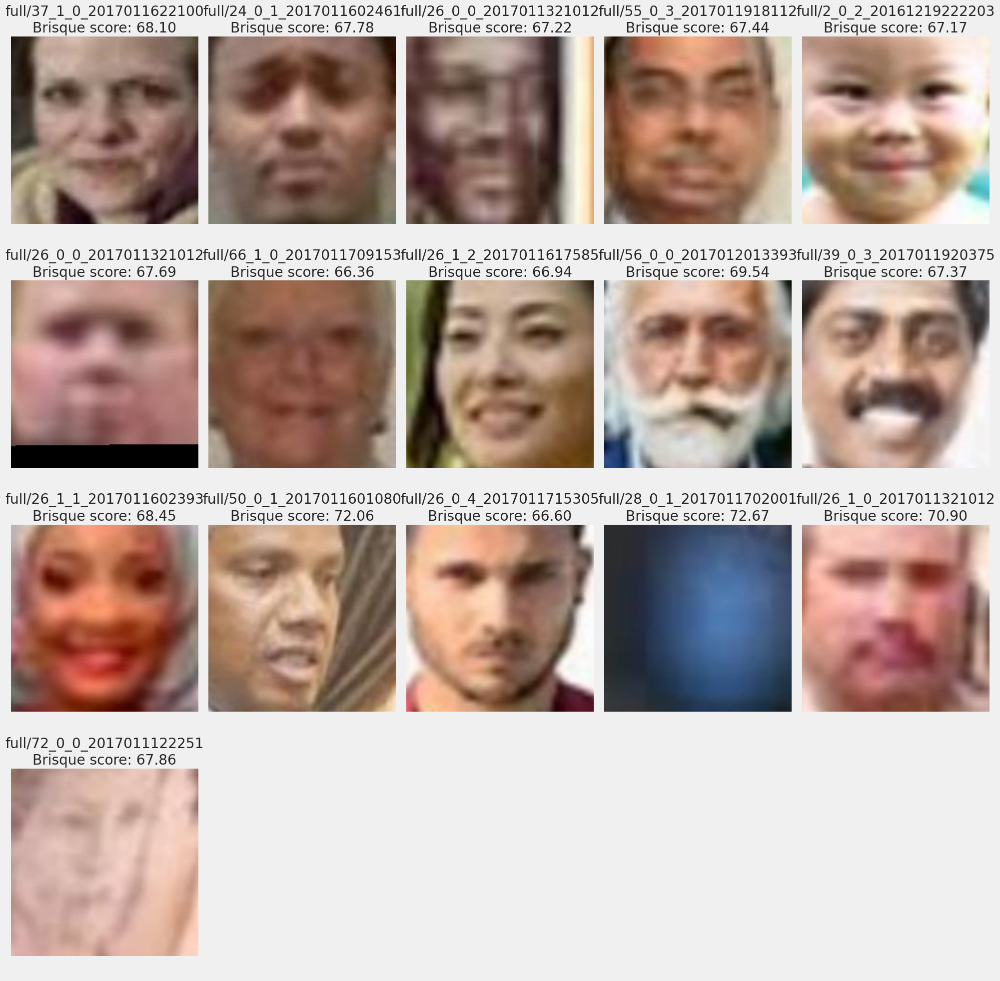

In [131]:
render_image_grid_by_variable(
    image_entropy_summary, "brisque_score", prct_thresh=0.15, higher_is_better=True
)

While these images seem mostly valid (i.e. contain human faces) we can see that `BRISQUE` wuold allow to filter out the images which have a very poor quality and would be too hard to classify. Also depending on production use cases it would be possible to just indicate to the user which images to classify or not.

#### Examples of High BRISQUE Images

thresh: -3.152889781340932, filtered_df: 35


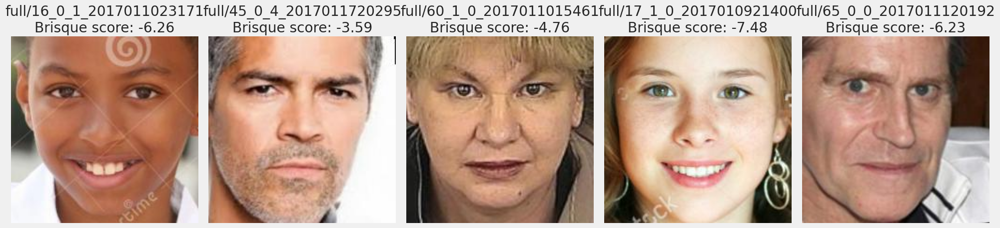

In [137]:
render_image_grid_by_variable(
    image_entropy_summary,
    "brisque_score",
    prct_thresh=0.15,
    sample_n=5,
    higher_is_better=False,
)

### Laplacian Variance

A measure of image sharpness/blurriness.
Uses the Laplacian operator to compute the second derivative of the image.
Measures the variance of the Laplacian-filtered image.


thresh: 17.4395013321, filtered_df: 35


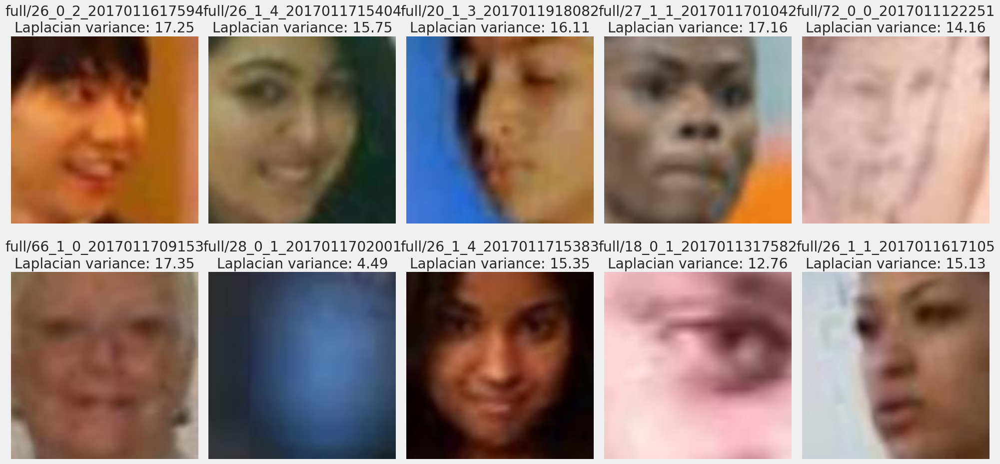

In [142]:
render_image_grid_by_variable(
    image_entropy_summary,
    "laplacian_variance",
    sample_n=10,
    prct_thresh=0.15,
    higher_is_better=False,
)
# image_entropy_summary

Laplacian Variance seems to correlate very highly with BRISQUE , bassically allow us to filter out very similar images.

### FFT-based Blur Detection

thresh: 0.8144524239654852, filtered_df: 35


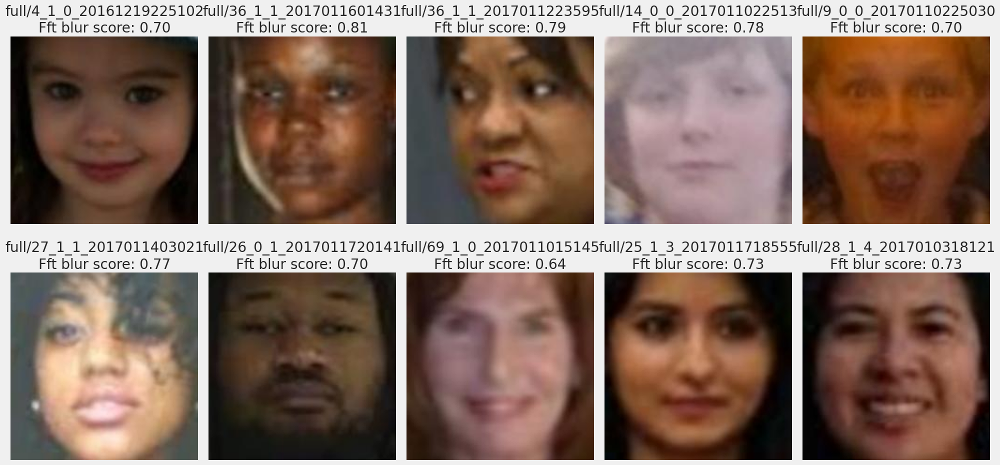

In [146]:
## FFT-based Blur Detection

render_image_grid_by_variable(
    image_entropy_summary,
    "fft_blur_score",
    sample_n=10,
    prct_thresh=0.15,
    higher_is_better=False,
)
# image_entropy_summary

FFT seems to be somewhat too agressive for our purposes, it assigns very low scores even with images with reasonably discernible faces.

## Feature Correlation

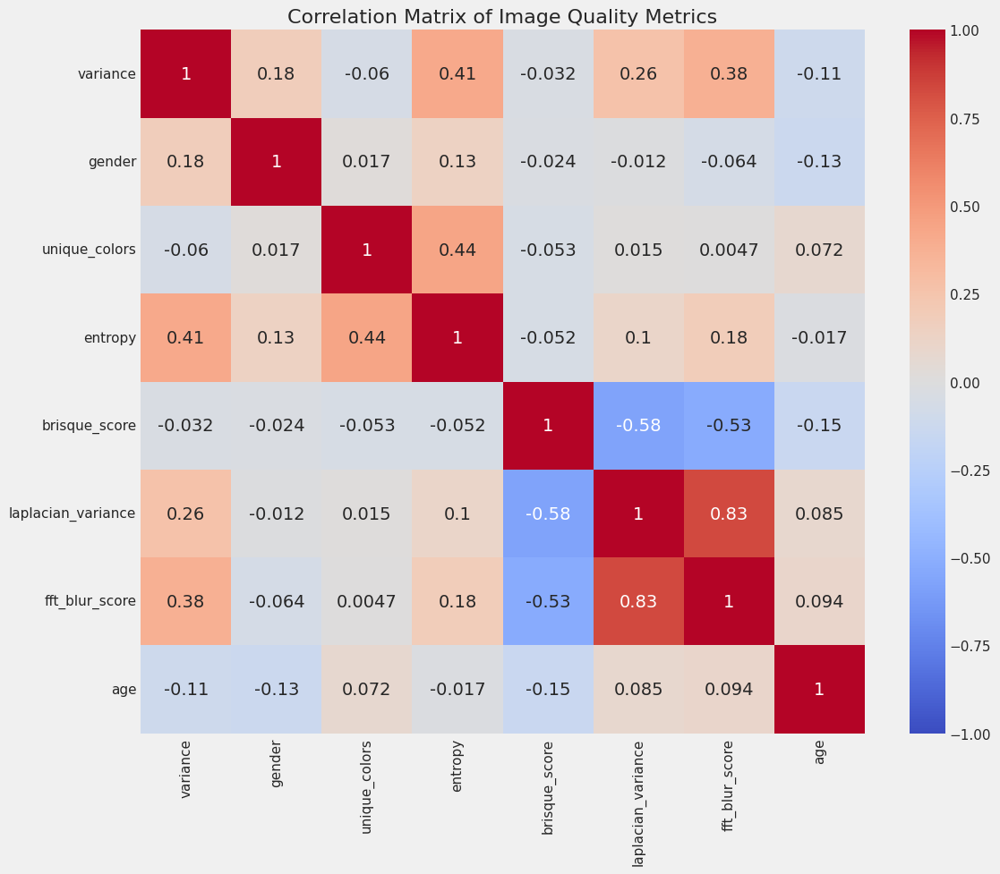

In [147]:
columns_to_correlate = [
    "variance",
    "gender",
    "unique_colors",
    "entropy",
    "brisque_score",
    "laplacian_variance",
    "fft_blur_score",
    "age",
]

corr_matrix = image_entropy_summary[columns_to_correlate].corr()

plt.figure(figsize=(12, 10))

sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1, center=0)

plt.title("Correlation Matrix of Image Quality Metrics", fontsize=16)

plt.tight_layout()
plt.show()

All the three new metrics are strongly correlated to each other just proving that they more or less measure the same thing (blurriness and amount of detail)

#### Color Chanel Distribution by Class

These plots show the normalized intensity (0 - 255) distributions of color channel by class. The Y show the normalized frequency (density) relative to all color channels (based on highest individual value for any channel).

The charts are made by generating a histogram for each image, normalizing it (normalization process maintains the shape of the histogram, meaning the relative distribution of pixel intensities is preserved. All histograms in the class are then averaged.

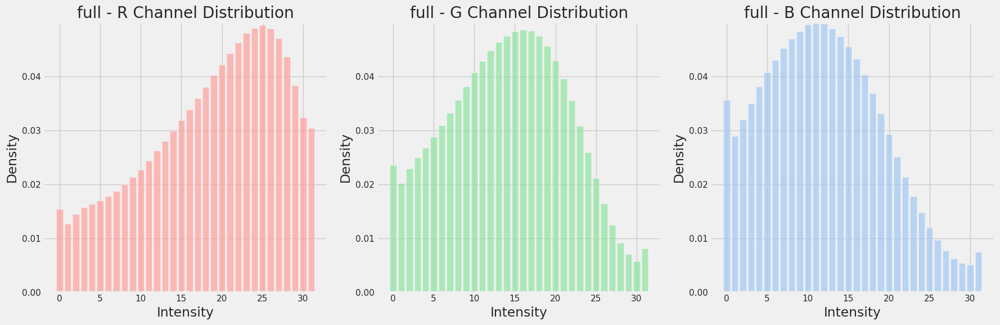

In [148]:
plot_color_distributions(color_distributions)